In [1]:
%matplotlib widget

# Feder Masse Schwinger

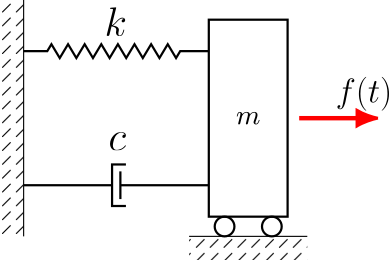

Der Feder Masse-Schwinger kann über die DGL:

\begin{equation*}
m\ddot{x}+b\dot{x}+cx = f(t)
\end{equation*}

beschrieben werden.

Diese DGL 2. Ordnung wird mit $v = \dot{x}$ in ein System 1. Ordnung umgeschrieben:

\begin{align*}
    m \dot{v} + b v + c x & = f(t) \\
    \dot{x} & = v
\end{align*}

Für eine numerische Behandlung von Differentialgleichungen ist es vorteilhaft sie auf die Form:

\begin{equation*}
    \dot{y}(t) = g(y,t)
\end{equation*}

zu bringen. Aus dem Gleichungssystem des Feder-Masse-Schwingers wird dann:

\begin{align*}
    \dot{v} & = \frac{f(t)}{m} - \frac{b}{m} v - \frac{c}{m} x \\
    \dot{x} & = v
\end{align*}

Die Kraftanregung erfolgt hier mit der Funktion:

\begin{equation*}
    f(t) = A \cos\left(\omega_F t\right)
\end{equation*}



# Analytische Lösung

Die Analytische Lösung ermitteln wir mit Hilfe des symbolischen Mathematik-Paketes __Sympy__

In [2]:
### Import necessary libs

from sympy import Function, dsolve, Eq, Derivative, symbols,cos
import sympy as sp
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
from scipy.integrate import solve_ivp, odeint
from matplotlib.animation import FuncAnimation
from matplotlib.patches import Circle, Rectangle, Arrow
from matplotlib.collections import PatchCollection
from IPython.display import HTML
from scipy import signal

In [3]:
# Define the independent variable
t = symbols('t')

# Define the dependent variable as a function of t
x = Function('x')

# Coefficients m,c,k and right-hand side F(t)
m, c, k, A, omega_F, x_0 = symbols('m c k A omega_F x_0')
F = symbols('F', cls=Function)

# The actual second-order ODE
ode = Eq( m*Derivative(x(t), t, t) + c*Derivative(x(t), t) + k*x(t), A*cos(omega_F*t))

# Solve ODE
solution = dsolve(ode, x(t),ics={x(0): x_0, Derivative(x(t), t).subs(t, 0): 0})
#sp.simplify(solution)

/home/steffen/anaconda3/envs/rise/lib/python3.10/site-packages/matplotlib/cbook.py:1719: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/home/steffen/anaconda3/envs/rise/lib/python3.10/site-packages/matplotlib/cbook.py:1355: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


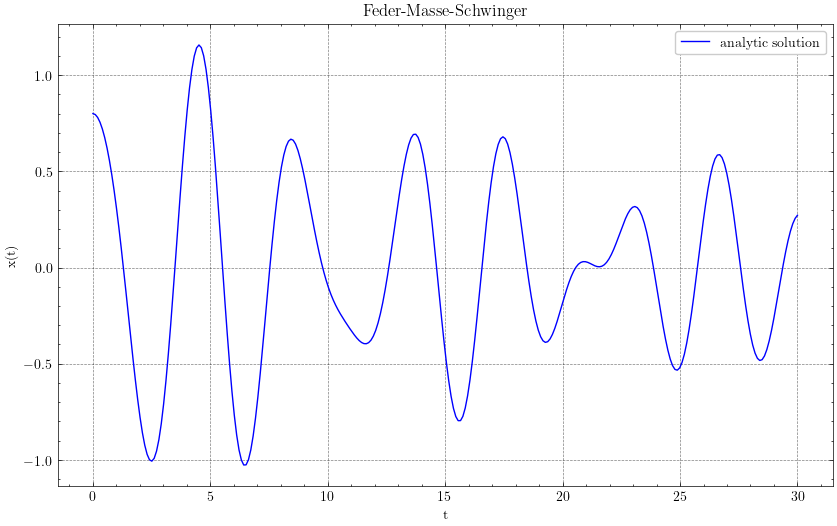

In [4]:
# Set specific values for parameter
argdict = {
    "m":5,
    "k":10,
    "c":0.5,
    "A" : 3,
    "omega_F":2
}
inidict = {
    "x_0":0.8,
    "xd_0":0
}


# define time-span and stepping
tsa = np.linspace(0,30,300)
# arguments and initial data
arg = [val for val in argdict.values()]
y0= np.array([val for val in inidict.values()])

def getAnalyticSolution(argdict,inidict,tsa):
        
    # transform symbolic function to callable method
    x_sol_a = sp.lambdify(t,solution.rhs.subs(argdict).subs(inidict))
    xa = x_sol_a(tsa)

    v_sol_a = sp.lambdify(t,sp.simplify(solution.rhs.subs(argdict).subs(inidict)).diff(t))
    va = v_sol_a(tsa)

    return xa,va,x_sol_a,v_sol_a

xa,va,x_sol_a,v_sol_a = getAnalyticSolution(argdict,inidict,tsa)
# plot function
plt.style.use(['science',"grid"])
fig, ax = plt.subplots(1,1,figsize=(10,6))
ax.plot(tsa,xa,'b',label="analytic solution")
ax.set_xlabel("t")
ax.set_ylabel("x(t)")
ax.set_title("Feder-Masse-Schwinger")
ax.legend()

fig.savefig("FederMasseSchwinger_analytisch.png",dpi=200)


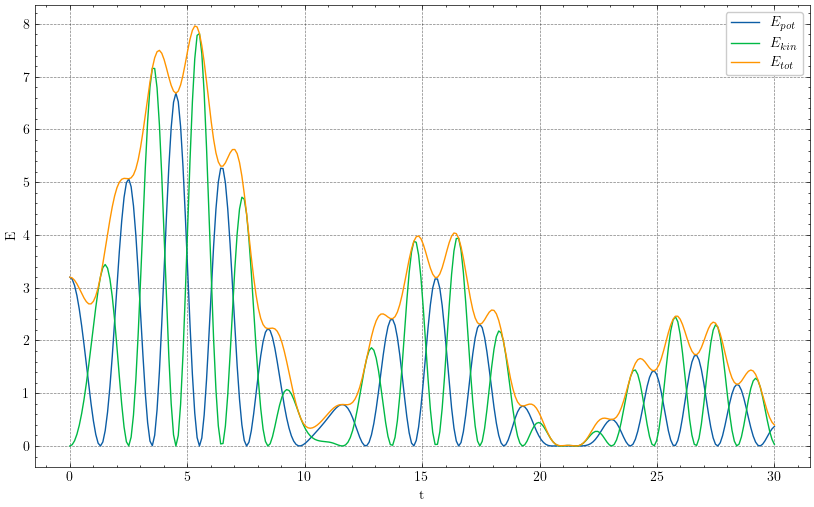

In [5]:
### Energy of the system

#### Potential energy
E_pot = (1/2*k.subs(argdict)*x_sol_a(tsa)**2)
# Define symbols
t = sp.symbols('t')
#### Kinetic energy
E_kin = (1/2*m.subs(argdict)*(v_sol_a(tsa))**2)
E_tot = E_pot + E_kin

### Plot Energy
fig,ax = plt.subplots(1,1,figsize=(10,6))
ax.plot(tsa,E_pot,label="$E_{pot}$")
ax.plot(tsa,E_kin,label="$E_{kin}$")
ax.plot(tsa,E_tot,label="$E_{tot}$")

ax.set_xlabel("t")
ax.set_ylabel("E")
ax.legend()


## Verschiedene numerische Verfahren zur Lösung der DGL


In [6]:
## External forcing $A cos(\omega t)$, set $A=0$ to make problem homogeneous
def forcing(t, A=0, omega=1):
    return A*np.cos(omega*t)

def forceNM(t):
    return np.array([forcing(t, argdict["A"], argdict["omega_F"])])

## Diffeq returns (x', x''), with algebraic expression for x'' solved above
def diffeq(t, u, m, k, b, A=0, omega=1):
    x = u[0]
    v = u[1]
    return np.array((v,-b/m*v-k/m*x+forcing(t, A, omega)/m))

## Jacobian der DGL
def jacdiffeq(t, u, m, k, b, A=0, omega=1):
    jac = np.zeros((np.shape(u)[0],np.shape(u)[0]))
    jac[0,0] = 0.0
    jac[0,1] = 1.0
    jac[1,0] = -k/m
    jac[1,1] = -b/m
    return jac

def energy(diffeq,t, u, m, k, b, A=0, omega=1):
    v,a = diffeq(t, u, m, k, b, A, omega)
    E_pot = 0.5*k*u[0]**2
    E_kin = 0.5*m*v**2
    E_tot = E_pot + E_kin
    return E_pot, E_kin, E_tot

def plotSolution(argdict,inidict,tsa,method,dt,ax,param=None):
    # arguments and initial data
    arg = [val for val in argdict.values()]
    y0= np.array([val for val in inidict.values()])
    
    xa,va,x_sol_a,v_sol_a = getAnalyticSolution(argdict,inidict,tsa)
    ax.clear()  # Clear the current axes
    t_end = tsa[-1]
    t_start = tsa[0]
    nsteps = int((t_end-t_start)/dt)
    ts = np.linspace(t_start,t_end,nsteps)
    
    y,E_pot,E_kin,E_tot= method(diffeq,y0,ts,arg)
    
    
    ax.plot(tsa,xa,label="analytic")
    ax.plot(ts,y,label=(method.__name__))
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=2)
    
    ax.set_xlabel("$t$")
    ax.set_ylabel("$x(t)$")
    
    ax.set_ylim([1.5*np.min(xa),1.5*np.max(xa)])

    
    plt.draw()  # Update the plot   

def plotSolution_impl(argdict,inidict,tsa,method,dt,ax,param=None):
    # arguments and initial data
    arg = [val for val in argdict.values()]
    y0= np.array([val for val in inidict.values()])
    
    xa,va,x_sol_a,v_sol_a = getAnalyticSolution(argdict,inidict,tsa)
    ax.clear()  # Clear the current axes
    t_end = tsa[-1]
    t_start = tsa[0]
    nsteps = int((t_end-t_start)/dt)
    ts = np.linspace(t_start,t_end,nsteps)
    
    y,E_pot,E_kin,E_tot= method(diffeq,jacdiffeq,y0,ts,arg)
    
    
    ax.plot(tsa,xa,label="analytic")
    ax.plot(ts,y,label=(method.__name__))
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=2)
    
    ax.set_xlabel("$t$")
    ax.set_ylabel("$x(t)$")
    
    ax.set_ylim([1.5*np.min(xa),1.5*np.max(xa)])

    
    plt.draw()  # Update the plot   
    
    
from ipywidgets import FloatSlider, interact,GridspecLayout


grid = GridspecLayout(3, 2)

# Widget to select dt
grid[0,0] = FloatSlider(value=0.1, min=0.001, max=1.0, step=0.001, description='Timestep (dt)')

grid[1,0] = FloatSlider(value=10, min=0.1, max=100.0, step=0.1, description='Stiffness k')

grid[2,0] = FloatSlider(value=5, min=0.1, max=100.0, step=0.1, description='Mass k')

grid[0,1] = FloatSlider(value=0.5, min=0.0, max=100.0, step=0.1, description='damping c')

grid[1,1] = FloatSlider(value=3, min=0.0, max=100.0, step=0.1, description='Force Amplitude A')

grid[2,1] = FloatSlider(value=2, min=0.0, max=100.0, step=0.1, description='Force frequency $\omega_F$')

# Function to update plot with new dt
def update_plot(dt,m,k,c,A,omega_F):

    argdict = {
    "m":m,
    "k":k,
    "c":c,
    "A" : A,
    "omega_F":omega_F
    }   
    plotSolution(argdict, inidict, tsa, integrator, dt, ax)

def update_plot_impl(dt,m,k,c,A,omega_F):

    argdict = {
    "m":m,
    "k":k,
    "c":c,
    "A" : A,
    "omega_F":omega_F
    }   
    plotSolution_impl(argdict, inidict, tsa, integrator, dt, ax)


### Euler Vorwärtsverfahren

Gegeben sei das Anfangswertproblem:
\begin{equation}
\dot{y}(t) = g(y, t), \quad y(t_0) = y_0
\end{equation}

Gesucht ist eine numerische Approximation der Lösung $ y(t) $ auf einem Zeitintervall $[t_0, T]$.

---

#### **Prinzip des Euler-Vorwärts-Verfahrens**
1. **Diskretisierung der Zeit**:
   - Wähle eine Schrittweite $ \Delta t > 0 $ und diskretisiere das Intervall:
     $ t_n = t_0 + n \Delta t $ für $ n = 0, 1, 2, \dots, N $, wobei $ N \Delta t = T - t_0 $.

2. **Iterative Berechnung**:
   - Starte mit dem Anfangswert $ y_0 $ zum Zeitpunkt $ t_0 $.
   - Approximiere die Lösung an den diskreten Zeitpunkten $ t_n $ durch:
     \begin{equation*}
     y_{n+1} = y_n + \Delta t \cdot g(y_n, t_n)
     \end{equation*}
   - Dabei ist $ y_n $ die Approximation von $ y(t_n) $.

---

### **Algorithmus**
1. **Initialisierung**:
   Setze $ y_0 $ und $ t_0 $.
2. **Iteration für $ n = 0, 1, \dots, N-1 $**:
   - Berechne $ y_{n+1} = y_n + \Delta t \cdot g(y_n, t_n) $.
   - Aktualisiere $ t_{n+1} = t_n + \Delta t $.

---

### **Eigenschaften**
- **Genauigkeit**: Das Verfahren hat eine **Fehlerordnung** von $ O(\Delta t) $.
- **Stabilität**: Konditional stabil – zu große Schrittweiten $ \Delta t $ können zu numerischer Instabilität führen (insbesondere bei **steifen** DGLs).
- **Einfachheit**: Leicht zu implementieren, aber oft ungenau für komplexe Systeme.

---


### **Hinweise**
- Für bessere Genauigkeit: **kleinere Schrittweite** $ \Delta t $ oder höhere Verfahren (z. B. Runge-Kutta) verwenden.
- Bei steifen DGLs: **implizite Verfahren** (z. B. Euler-Rückwärts) bevorzugen.

In [7]:
def euler_vorwaerts(ode,y0,ts,arguments):
    """Euler Vorwärts Methode zur Lösung von System von DGL erster Ordnung
      ode: Funktion der DGL
      y0: Anfangswert
      ts: Zeitpunkte
      arguments : Zusätzliche Argumente für die DGL
    """
    y0t = np.array([y0]) if np.isscalar(y0) else y0
    y = np.zeros((len(ts),len(y0t)))
    E_pot = np.zeros((len(ts),1))
    E_kin = np.zeros((len(ts),1))
    E_tot = np.zeros((len(ts),1))
    E_pot[0],E_kin[0],E_tot[0] = energy(ode,ts[0], y0, *arguments)
    y[0,:] = y0t
    tn = ts[0]
    for i,t in enumerate(ts[1:]):
        dt = t-tn
        y[i+1,:] = y[i,:] + dt * ode(tn,y[i,:],*arguments) 
        E_pot[i+1],E_kin[i+1],E_tot[i+1] = energy(ode,t, y[i+1], *arguments)
        tn = t
    return y[:,0],E_pot,E_kin,E_tot

interactive(children=(FloatSlider(value=0.1, description='Timestep (dt)', layout=Layout(grid_area='widget001')…

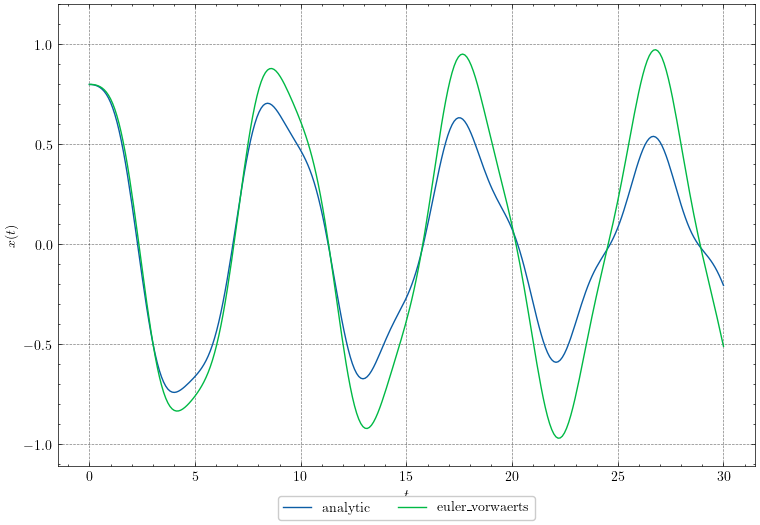

In [8]:
integrator = euler_vorwaerts
fig, ax = plt.subplots(figsize=(9,6))
# Create interactive plot
interact(update_plot, dt=grid[0,0],m=grid[1,0],k=grid[2,0],c=grid[0,1],A=grid[1,1],omega_F=grid[2,1]);  

#display(grid)

#### **Prinzip des Heun-Verfahrens**
1. **Diskretisierung der Zeit**:
   - Wähle eine Schrittweite $ \Delta t > 0 $ und diskretisiere das Intervall:
     $ t_n = t_0 + n \Delta t $ für $ n = 0, 1, 2, \dots, N $, wobei $ N \Delta t = T - t_0 $.

2. **Iterative Berechnung**:
   - Starte mit dem Anfangswert $ y_0 $ zum Zeitpunkt $ t_0 $.
   - Approximiere die Lösung an den diskreten Zeitpunkten $ t_n $ durch einen zweistufigen Prozess:
     1. Berechne zunächst einen vorläufigen Wert $ \tilde{y}_{n+1} $ mittels Euler-Vorwärtsverfahren:
        \begin{equation*}
        \tilde{y}_{n+1} = y_n + \Delta t \cdot f(y_n, t_n)
        \end{equation*}
     2. Nutze diesen vorläufigen Wert, um den Schlusswert $ y_{n+1} $ zu verbessern:
        \begin{equation*}
        y_{n+1} = y_n + \frac{\Delta t}{2} \left( f(y_n, t_n) + f(\tilde{y}_{n+1}, t_{n+1}) \right)
        \end{equation*}
   - Dabei ist $ y_n $ die Approximation von $ y(t_n) $ und $ t_{n+1} = t_n + \Delta t $.

---

### **Algorithmus**
1. **Initialisierung**:
   Setze $ y_0 $ und $ t_0 $.
2. **Iteration für $ n = 0, 1, \dots, N-1 $**:
   - Berechne den vorläufigen Wert $ \tilde{y}_{n+1} $ wie beim Euler-Vorwärtsverfahren:
     \begin{equation*}
     \tilde{y}_{n+1} = y_n + \Delta t \cdot f(y_n, t_n)
     \end{equation*}
   - Bestimme den endgültigen Wert $ y_{n+1} $ mithilfe des gewichteten Durchschnitts:
     \begin{equation*}
     y_{n+1} = y_n + \frac{\Delta t}{2} \left( f(y_n, t_n) + f(\tilde{y}_{n+1}, t_{n+1}) \right)
     \end{equation*}
   - Aktualisiere $ t_{n+1} = t_n + \Delta t $.

---

### **Eigenschaften**
- **Genauigkeit**: Das Heun-Verfahren hat eine **Fehlerordnung** von $ O(\Delta t^2) $, was es genauer macht als das Euler-Verfahren.
- **Stabilität**: Auch das Heun-Verfahren ist bedingt stabil, erfordert aber aufgrund seiner höheren Genauigkeit möglicherweise weniger restriktive Schrittweiten als das Euler-Verfahren.
- **Komplexität**: Etwas komplexer in der Implementierung als das Euler-Verfahren, da zwei Auswertungen der Funktion $ f $ pro Schritt erforderlich sind.
- **Anwendung**: Gut geeignet für Probleme, bei denen eine verbesserte Genauigkeit gegenüber dem Euler-Verfahren erwünscht ist, ohne dabei auf komplexe implizite Verfahren zurückgreifen zu müssen.

In [9]:

def heun(ode, y0, ts, arguments):
    """
    Heun's Method zur Lösung eines Systems von DGL erster Ordnung.
    
    Parameters
    ----------
    ode : callable
        Funktion der DGL (t, y, ...).
    y0 : array_like
        Anfangswert.
    ts : array_like
        Zeitpunkte.
    arguments : tuple
        Zusätzliche Argumente für die DGL.
        
    Returns
    -------
    y : ndarray
        Array, das die Näherungslösung an jedem Zeitpunkt enthält.
    """
    y0t = np.array([y0]) if np.isscalar(y0) else y0
    y = np.zeros((len(ts), len(y0t)))
    E_pot = np.zeros((len(ts),1))
    E_kin = np.zeros((len(ts),1))
    E_tot = np.zeros((len(ts),1))
    E_pot[0],E_kin[0],E_tot[0] = energy(ode,ts[0], y0, *arguments)
    y[0, :] = y0t
    tn = ts[0]
    
    for i, t in enumerate(ts[1:]):
        dt = t - tn
        
        # Berechne die Steigung k1 am Anfang des Intervalls
        k1 = ode(tn, y[i, :], *arguments)
        
        # Berechne den vorläufigen Wert für y am Ende des Intervalls
        y_tilde = y[i, :] + dt * k1
        
        # Berechne die Steigung k2 am vorläufigen Endpunkt des Intervalls
        k2 = ode(t, y_tilde, *arguments)
        
        # Berechne den endgültigen Wert für y
        y[i+1, :] = y[i, :] + (dt / 2) * (k1 + k2)
        E_pot[i+1],E_kin[i+1],E_tot[i+1] = energy(ode,t, y[i+1], *arguments)
        tn = t
    
    return y[:,0],E_pot,E_kin,E_tot



interactive(children=(FloatSlider(value=0.1, description='Timestep (dt)', layout=Layout(grid_area='widget001')…

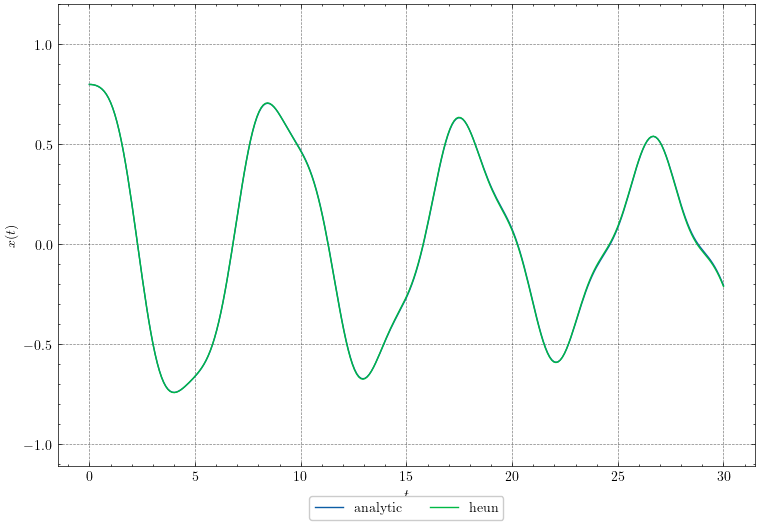

In [10]:
integrator = heun
fig, ax = plt.subplots(figsize=(9,6))
# Create interactive plot
interact(update_plot, dt=grid[0,0],m=grid[1,0],k=grid[2,0],c=grid[0,1],A=grid[1,1],omega_F=grid[2,1]); 

### Vergleich Methode von Heun vs. Euler Explizit

In [11]:

ts = np.linspace(0,np.max(tsa),400)
y,E_pot_ev,E_kin_ev,E_tot_ev=euler_vorwaerts(diffeq,y0,ts,arg)
yh,E_pot_h,E_kin_h,E_tot_h = heun(diffeq,y0,ts,arg)

# scipy method for integration
yode = odeint(diffeq, y0, ts, tfirst=True, args=tuple(arg))[:,0] 
       
print(f"delta_t: {ts[1]-ts[0]}")

delta_t: 0.07518796992481203


/home/steffen/anaconda3/envs/rise/lib/python3.10/site-packages/matplotlib/cbook.py:1719: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/home/steffen/anaconda3/envs/rise/lib/python3.10/site-packages/matplotlib/cbook.py:1355: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/home/steffen/anaconda3/envs/rise/lib/python3.10/site-packages/matplotlib/transforms.py:2876: ComplexWarning: Casting complex values to real discards the imaginary part
  vmin, vmax = map(float, [vmin, vmax])


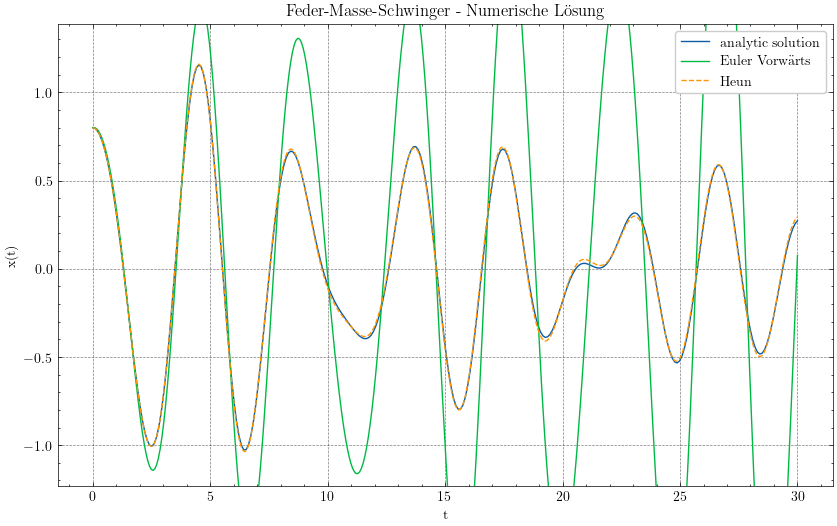

In [12]:
fig, ax = plt.subplots(1,1,figsize=(10,6))
ax.plot(tsa,xa,label="analytic solution")
ax.set_xlabel("t")
ax.set_ylabel("x(t)")
ax.set_title("Feder-Masse-Schwinger - Numerische Lösung")
ax.plot(ts,y,label="Euler Vorwärts")
ax.plot(ts,yh,"--",label="Heun")
# ax.set_xlim([0,3])
# ax.set_ylim([-1,1])
ax.set_ylim([1.2*np.min(xa),1.2*np.max(xa)])

ax.legend()

fig.savefig("Federschwinger_Euler.png",dpi=200)



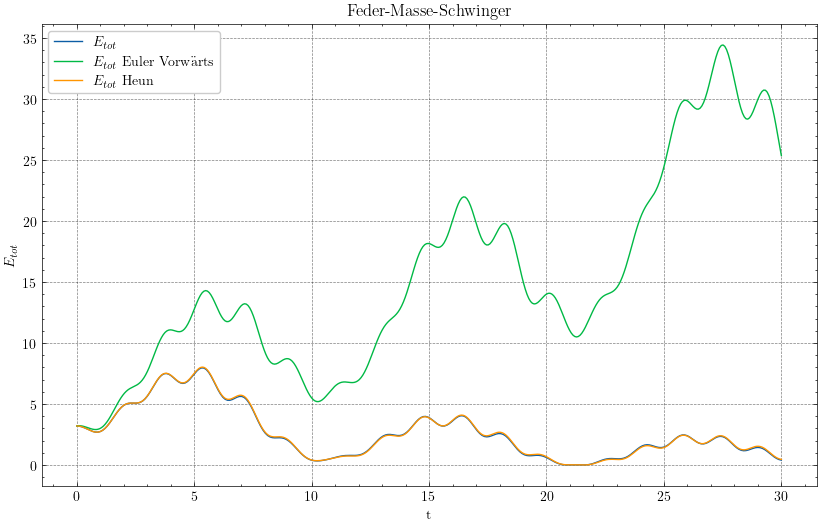

In [13]:
fig, ax = plt.subplots(1,1,figsize=(10,6))
ax.plot(tsa,E_tot,label="$E_{tot}$")
ax.plot(ts,E_tot_ev,label="$E_{tot}$ Euler Vorwärts")
ax.plot(ts,E_tot_h,label="$E_{tot}$ Heun")
ax.set_xlabel("t")
ax.set_ylabel("$E_{tot}$")
ax.set_title("Feder-Masse-Schwinger")

# ax.set_ylim([1.2*np.min(xa),1.2*np.max(xa)])

ax.legend()



## Euler-Rückwärts Verfahren

Das Euler-Rückwärts Verfahren, auch bekannt als implizites Euler-Verfahren, ist eine Methode zur numerischen Lösung von gewöhnlichen Differentialgleichungen (ODEs). Es wird oft verwendet, wenn ein System steife ODEs beinhaltet oder wenn eine höhere Stabilität als beim expliziten Euler-Verfahren erforderlich ist.

### Grundkonzept:

- **Implizite Methode:** Im Gegensatz zum expliziten Euler-Verfahren, bei dem der nächste Schritt direkt aus dem aktuellen Schritt berechnet wird, erfordert das implizite Verfahren die Lösung einer Gleichung zu jedem Zeitschritt.
  
### Schritte des Verfahrens:

1. **Ausgangspunkt:**
   Gegeben sei die ODE $ \frac{dx}{dt} = f(t, x) $ mit Anfangsbedingung $ x(t_0) = x_0 $.

2. **Diskretisierung der Zeit:**
   Die Zeitachse wird in diskrete Schritte unterteilt: $ t_{n+1} = t_n + \Delta t $, wobei $ \Delta t $ die Schrittweite darstellt.

3. **Rückwärtsschritt:**
   Statt den nächsten Wert anhand des aktuellen zu berechnen, bestimmt man ihn über den unbekannten nächsten Wert:

   \begin{equation*}
   x_{n+1} = x_n + \Delta t \cdot f(t_{n+1}, x_{n+1})
   \end{equation*}

   Hierin liegt die Implizität der Methode, da $ x_{n+1} $ auf beiden Seiten der Gleichung vorkommt.

4. **Lösen der impliziten Gleichung:**
   Zur Bestimmung von $ x_{n+1} $ muss häufig eine algebraisches Gleichungssystem gelöst werden. Dies erfordert iterative Methoden wie das Newton-Verfahren. Im folgenden wird der Index $n+1$ weggelassen und einfach $x$ geschrieben. Ein neuer Index $k$ wird eingeführt, welcher die Iteration des Newton-Verfahrens kennzeichnet.

   \begin{align*}
        R(x_{k+1}) & = x_{n+1} - \left( x_n + \Delta t \cdot f(t_{n+1}, x_{n+1}) \right) & \rightarrow & 0 \\
        R(x_{k+1}) & \approx R(x_k) + \frac{\partial R(x_k)}{\partial x_k} \Delta x_k & = 0 &\\
        \Delta x_k & = -R(x_k) \left(\frac{\partial R(x_k)}{\partial x_k} \right)^{-1} & & \\
        x_{k+1} & =x_k + \Delta x_k & &
   \end{align*}

    Hierbei ist $\frac{\partial R(x_k)}{\partial x_k}$ die Jacobian $J$ des Residuums und für das implizite Eulerverfahren gleich:

    \begin{equation*}
        J = 1 - \Delta t \frac{\partial f(t_{n+1})}{\partial x_k}
    \end{equation*}

### Eigenschaften des Euler-Rückwärts Verfahrens:

- **Stabilität:** Für steife Differentialgleichungen und Systeme mit großen Schrittweiten bietet dieses Verfahren bessere Stabilitätseigenschaften.Es ist **unbedingt stabil** (A-stabil). Egal welche Schrittweite genutzt wird, die Lösung bleibt stabil.
- **Robustheit:** Es ist allgemein robuster in Bezug auf numerische Fehler bei der Berechnung.
- **Genauigkeit:** Das Verfahren hat eine **Fehlerordnung** von $ O(\Delta t) $.


### Nachteile des Euler-Rückwärts Verfahrens:

- **Rechenaufwand:** Wegen der Notwendigkeit, eine implizite Gleichung zu lösen, ist der Rechenaufwand pro Schritt höher.
- **Komplexität:** Das Lösen nichtlinearer Gleichungen kann komplex und herausfordernd sein.

In der Praxis ist das Euler-Rückwärts Verfahren eine sehr nützliche Methode für steife Problemen (FEM), aber es ist wichtig zu berücksichtigen, dass der zusätzliche Rechenaufwand gerechtfertigt sein muss durch die Vorteile in der Stabilität und Genauigkeit, die es bietet.


In [14]:

def newton_raphson_multivariate(f, J, x0, tol=1e-6, max_iter=100):
    """
    Newton-Raphson method for finding roots of multivariate functions.

    Parameters:
    f (function): The multivariate function to find roots of.
    J (function): The Jacobian matrix of f.
    x0 (array): Initial guess for the root.
    tol (float): Tolerance for convergence.
    max_iter (int): Maximum number of iterations.

    Returns:
    array: Approximate root of the function.
    """
    x = np.array(x0, dtype=float)
    # print('----------------------')
    for i in range(max_iter):
        fx = f(x)
        # print(f'it: {i}, res: {fx}')
        Jx = J(x)
        delta = np.linalg.solve(Jx, -fx)
        x_new = x + delta

        if np.linalg.norm(delta) < tol:
            return x_new

        x = x_new

    raise RuntimeError("Newton-Raphson did not converge within maximum iterations")

def euler_implicit(f, J, y0, ts,arguments):
    """
    Euler implicit method for solving ODEs.

    Parameters:
    f (function): The right-hand side of the ODE dy/dt = f(y, t).
    J (function): The Jacobian matrix of f with respect to y.
    y0 (array): Initial condition.
    ts (array): Time points at which to solve the ODE.
    arguments (tupel): Additional arguments for f and J.

    Returns:
    y - y is the solution array.
    """
    
    y = np.zeros((len(ts), len(y0)))
    E_pot = np.zeros((len(ts),1))
    E_kin = np.zeros((len(ts),1))
    E_tot = np.zeros((len(ts),1))
    E_pot[0],E_kin[0],E_tot[0] = energy(f,ts[0], y0, *arguments)
    
    y[0,:] = y0

    tn = ts[0]
    for i,t in enumerate(ts[1:]):
        dt = t-tn
        def residual(y_new):
            return y_new - ( y[i,:] + dt * f(t,y_new,*arguments))

        def Jac(y_new):
            return np.eye(len(y0)) - dt * J(t,y_new,*arguments)
        
        y[i+1,:] = newton_raphson_multivariate(residual, Jac, y[i,:])
        E_pot[i+1],E_kin[i+1],E_tot[i+1] = energy(f,t, y[i+1], *arguments)
        tn = t

    return y[:,0],E_pot,E_kin,E_tot

yimp,E_pot_i,E_kin_i,E_tot_i = euler_implicit(diffeq, jacdiffeq, y0, ts,arg)

interactive(children=(FloatSlider(value=0.1, description='Timestep (dt)', layout=Layout(grid_area='widget001')…

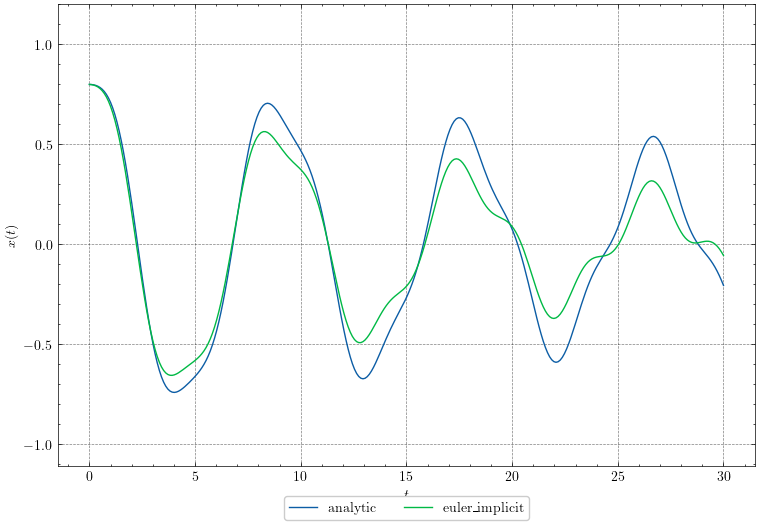

In [15]:
integrator = euler_implicit
fig, ax = plt.subplots(figsize=(9,6))
# Create interactive plot
interact(update_plot_impl, dt=grid[0,0],m=grid[1,0],k=grid[2,0],c=grid[0,1],A=grid[1,1],omega_F=grid[2,1]); 

/home/steffen/anaconda3/envs/rise/lib/python3.10/site-packages/matplotlib/cbook.py:1719: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/home/steffen/anaconda3/envs/rise/lib/python3.10/site-packages/matplotlib/cbook.py:1355: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/home/steffen/anaconda3/envs/rise/lib/python3.10/site-packages/matplotlib/transforms.py:2876: ComplexWarning: Casting complex values to real discards the imaginary part
  vmin, vmax = map(float, [vmin, vmax])


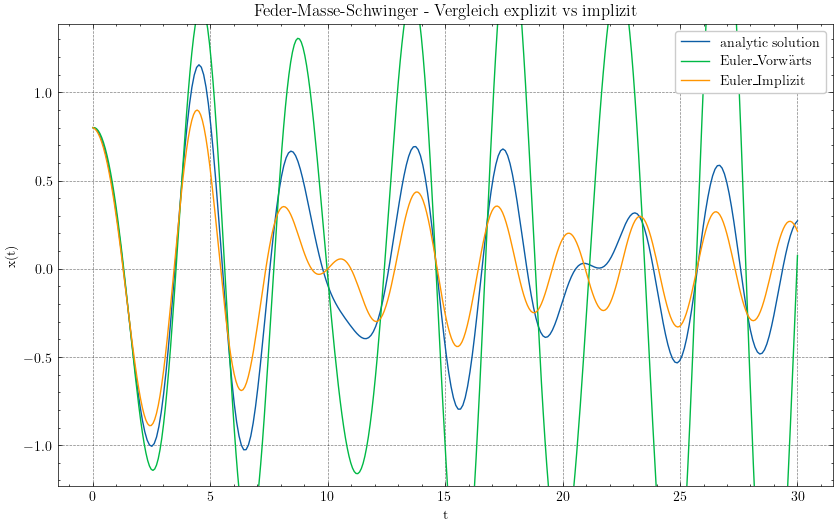

In [16]:
fig, ax = plt.subplots(1,1,figsize=(10,6))
ax.plot(tsa,xa,label="analytic solution")
ax.set_xlabel("t")
ax.set_ylabel("x(t)")
ax.set_title("Feder-Masse-Schwinger - Vergleich explizit vs implizit")
ax.plot(ts,y,label="Euler_Vorwärts")
# ax.plot(ts,yode,'m',label="Scipy")
ax.plot(ts,yimp,label="Euler_Implizit")

# ax.set_xlim([0,3])
# ax.set_ylim([-1,1])
ax.set_ylim([1.2*np.min(xa),1.2*np.max(xa)])

ax.legend()

fig.savefig("Federschwinger_Euler_imp.png",dpi=200)



# Theta Verfahren



In [17]:

def theta_Verfahren(f, J, y0, ts,arguments,theta=0.5):
    """
    Euler implicit method for solving ODEs.

    Parameters:
    f (function): The right-hand side of the ODE dy/dt = f(y, t).
    J (function): The Jacobian matrix of f with respect to y.
    y0 (array): Initial condition.
    ts (array): Time points at which to solve the ODE.
    arguments (tupel): Additional arguments for f and J.
    theta (float):  Theta factor

    Returns:
    y - y is the solution array.
    """
    
    y = np.zeros((len(ts), len(y0)))
    E_pot = np.zeros((len(ts),1))
    E_kin = np.zeros((len(ts),1))
    E_tot = np.zeros((len(ts),1))
    E_pot[0],E_kin[0],E_tot[0] = energy(f,ts[0], y0, *arguments)
    y[0,:] = y0

    tn = ts[0]
    for i, t in enumerate(ts[1:]):
        dt = t - tn
        
        def residual(y_new):
            return y_new - y[i, :] - theta * dt * f(t, y_new, *arguments) \
                   - (1-theta) * dt * f(tn, y[i, :], *arguments)
                   
        def Jac(y_new):
            return np.eye(len(y0)) - theta * dt * J(t, y_new, *arguments)
        
        y[i+1, :] = newton_raphson_multivariate(residual, Jac, y[i, :])
        E_pot[i+1],E_kin[i+1],E_tot[i+1] = energy(f,t, y[i+1], *arguments)
        tn = t

    return y[:,0],E_pot,E_kin,E_tot

ytheta,E_pot_t,E_kin_t,E_tot_t = theta_Verfahren(diffeq, jacdiffeq, y0, ts,arg,0.5)


/home/steffen/anaconda3/envs/rise/lib/python3.10/site-packages/matplotlib/cbook.py:1719: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/home/steffen/anaconda3/envs/rise/lib/python3.10/site-packages/matplotlib/cbook.py:1355: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/home/steffen/anaconda3/envs/rise/lib/python3.10/site-packages/matplotlib/transforms.py:2876: ComplexWarning: Casting complex values to real discards the imaginary part
  vmin, vmax = map(float, [vmin, vmax])


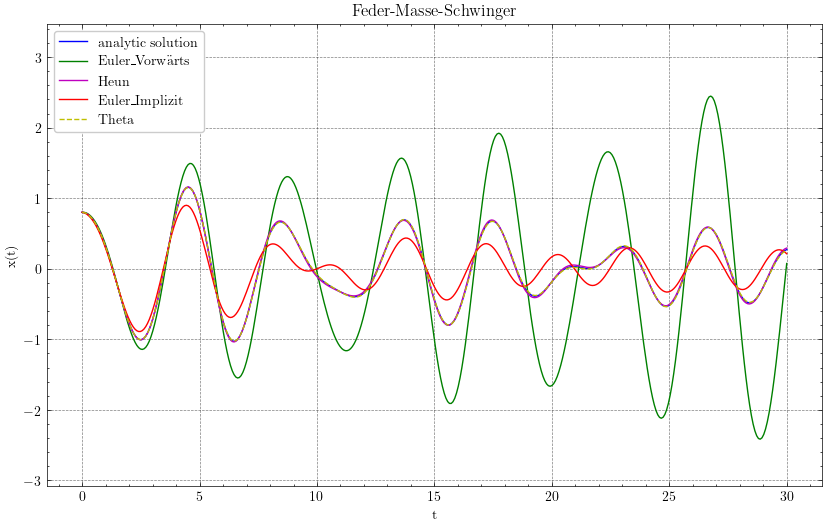

In [18]:
fig, ax = plt.subplots(1,1,figsize=(10,6))
ax.plot(tsa,xa,'b',label="analytic solution")
ax.set_xlabel("t")
ax.set_ylabel("x(t)")
ax.set_title("Feder-Masse-Schwinger")
ax.plot(ts,y,'g',label="Euler_Vorwärts")
ax.plot(ts,yh,'m',label="Heun")
# ax.plot(ts,yode,'m',label="Scipy")
ax.plot(ts,yimp,'r',label="Euler_Implizit")
ax.plot(ts,ytheta,'y--',label="Theta")

# ax.set_xlim([0,3])
# ax.set_ylim([-1,1])
ax.set_ylim([3*np.min(xa),3*np.max(xa)])

ax.legend()



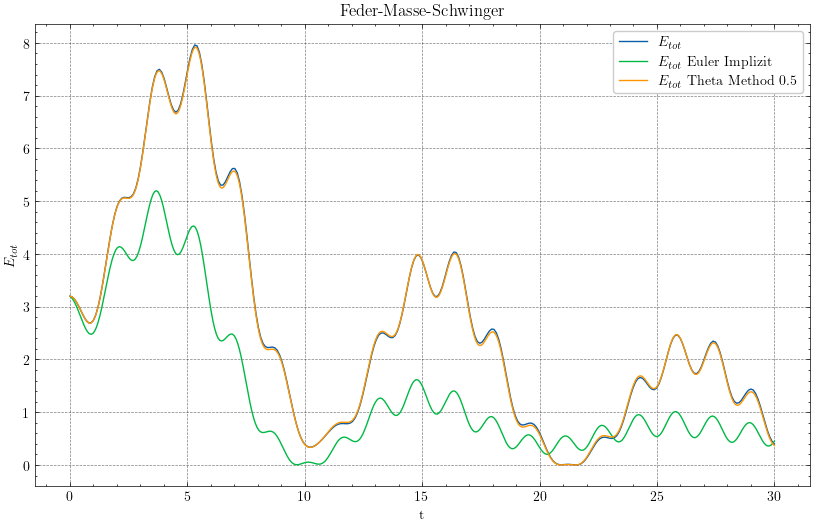

In [19]:
fig, ax = plt.subplots(1,1,figsize=(10,6))
ax.plot(tsa,E_tot,label="$E_{tot}$")
ax.plot(ts,E_tot_i,label="$E_{tot}$ Euler Implizit")
ax.plot(ts,E_tot_t,label="$E_{tot}$ Theta Method 0.5")
ax.set_xlabel("t")
ax.set_ylabel("$E_{tot}$")
ax.set_title("Feder-Masse-Schwinger")

# ax.set_xlim([0,3])
# ax.set_ylim([-1,1])

ax.legend()



## Theta Method:

Given an ODE of the form

\begin{equation*}
 \frac{dy}{dt} = f(y, t) 
\end{equation*}

with an initial condition $y(t_0) = y_0$, the theta-method update equation from time $t_n$ to $t_{n+1}$ with a timestep $ \Delta t = t_{n+1} - t_n $ is given by:

$$ y_{n+1} = y_n + \theta \Delta t f(y_{n+1}, t_{n+1}) + (1 - \theta) \Delta t f(y_n, t_n) $$

Here:
- $y_n$ is the known solution at time $t_n$.
- $y_{n+1}$ is the unknown solution at time $t_{n+1}$.
- $f(y, t)$ is the right-hand side function of the ODE.
- $\theta$ is a parameter that determines the weighting between the explicit and implicit terms, with $0 \leq \theta \leq 1$.

When $\theta = 0$, the method is equivalent to the explicit Euler method:

\begin{equation*}
 y_{n+1} = y_n + \Delta t f(y_n, t_n) 
\end{equation*}

When $\theta = 1$, it corresponds to the implicit Euler method:

\begin{equation*}
 y_{n+1} = y_n + \Delta t f(y_{n+1}, t_{n+1}) 
\end{equation*}

For values of $\theta$ between 0 and 1, you get a blended scheme that combines aspects of both explicit and implicit methods.

In order to solve for $y_{n+1}$ in the case where $\theta \neq 0$, a nonlinear system has to be solved because $y_{n+1}$ implicitly depends on itself through the term $f(y_{n+1}, t_{n+1})$. This is typically done using iterative methods like the Newton-Raphson method, which requires the computation of the residual and the Jacobian of the residual, as described in the previously modified function `theta_method`.

The specific residual $R(y_{n+1})$ to be used in the Newton-Raphson method for finding $y_{n+1}$ is:

\begin{equation*}
 R(y_{n+1}) = y_{n+1} - y_n - \theta \Delta t f(y_{n+1}, t_{n+1}) - (1 - \theta) \Delta t f(y_n, t_n) 
\end{equation*}

And its Jacobian $J_R(y_{n+1})$ is:

\begin{equation*}
J_R(y_{n+1}) = I - \theta \Delta t J_f(y_{n+1}, t_{n+1})
\end{equation*}

where $I$ is the identity matrix and $J_f(y_{n+1}, t_{n+1})$ is the Jacobian of the function $f$ evaluated at $y_{n+1}$ and $t_{n+1}$.

# Animation

In [20]:
def damped_harmonic_oscillator_sbe(m=0.2, b=0.1, k=1, x0=[-2, 0], 
                               A=0, omega=1, fps=3, tf=30):
        
    nframe = int(fps*tf) # Setup number of frames for animation

    ts=np.linspace(0.0, tf, nframe)  # time to evaluate solution

    # Setup and solve 1d system with odeint
    # us = odeint(diffeq, x0, ts, tfirst=True, args=(m, k, b, A, omega))
    xs,E_pot_t,E_kin_t,E_tot_t = theta_Verfahren(diffeq, jacdiffeq, x0, ts,(m, b,k, A, omega),0.5) 

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12,8), gridspec_kw={'height_ratios': [3, 2]})

    # Support spring
    h1 = 2
    w1 = 0.5
    
    x1 = 0
    y1 = -h1/2
    rectangles = []
    rectangle = Rectangle((x1,y1), w1, h1, animated=True, facecolor='black', alpha=0.5)
    rectangles.append(rectangle)

    # Mass
    w2 = 1
    h2 = 1
    max_displacement = np.max(np.abs(xs))
    if max_displacement > 3:
        x2 = 5 + np.max(np.abs(xs))
    else:
        x2 = 5
    y2 = -h2/2
    rectangle = Rectangle((x2, y2), w2, h2, animated=True, facecolor='green', alpha=0.8)
    rectangles.append(rectangle)

    ln, = ax1.plot([], [], 'k')

    if max_displacement > 3:
        line_min = x2-max_displacement
        line_max = x2+max_displacement+1
    else:    
        line_min = x2-3
        line_max = x2+4
    ax1.plot([line_min, line_max], -0.5*np.array([1, 1]), 'k')
    ax1.axvline(x2+0.5*w2, ls=':')
    
    # Print Force vector
    if max_displacement > 3:
        x3 = 6 + np.max(np.abs(xs))
    else:
        x3 = 6
    if A != 0 and omega !=0:
        dx = 1
    else:
        dx = 0
    arrows = []    
    arrow = Arrow(x3,0,dx,0,animated=True, facecolor='red')
    arrows.append(arrow)

    patches =  rectangles + arrows
        
    p = PatchCollection(patches, match_original=True)
    ax1.add_collection(p)
    ax1.set_ylim([-1.5, 1.5])
    ax1.set_xlim([-1.5, line_max])
    ax1.set_aspect(1)

    # Set up animation for second plot of displacement over time
    disp_line = ax2.plot([], [], 'b')[0]
    force_line = ax2.plot([], [], 'r')[0]
    analytic_line = ax2.plot([], [], 'g')[0]
    ax2.set_xlabel('Time')
    ax2.set_ylabel('X: Displacement / Force')
    ax2.legend(['x(t)','F(t)'])

    # Limits set for second plot
    ax2.set_xlim([ts.min(), ts.max()])
    ax2.set_ylim([xs.min(), xs.max()])
    ax2.plot([ts.min(),ts.max()],[0,0], 'r:'); # line to show zero displacement

    plt.tight_layout()
    plt.close()

    def animate(i):
        
        x_mass_value = xs[i]+x2
        rectangles[1].set_x(x_mass_value)
        x_rect_value = x1
        arrows[0].set_data(x_mass_value+1,0,forcing(ts[i],A,omega),0)
        
          
        x_spring = np.linspace(x_rect_value+w1, x_mass_value, 500)
        y_spring = 0.4*signal.sawtooth(20*np.pi*\
                                       (x_spring-x_rect_value-w1)/\
                                       (x_mass_value-x_rect_value-w1)+\
                                       np.pi/2, 
                                       0.5)
        ln.set_data(x_spring, y_spring)
        
        
        
        p.set_paths(patches)
        
        # Animate displacement over time
        disp_line.set_data(ts[0:i],xs[0:i])
        # force_line.set_data(ts[0:i],forcing(ts[0:i],A,omega))
        analytic_line.set_data(tsa,xa)
        return

    ani = FuncAnimation(fig, animate, frames=nframe, interval=250/fps, blit=False)

    display(HTML(ani.to_jshtml()))
    
damped_harmonic_oscillator_sbe(arg[0],  # mass
                           arg[1],  # friction
                           arg[2],  # stiffness
                           x0=y0,
                           A=arg[3],  # amplitude of forcing
                           omega = arg[4],  # frequency coefficient
                           tf=np.max(tsa))

/home/steffen/anaconda3/envs/rise/lib/python3.10/site-packages/matplotlib/cbook.py:1355: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


# Newmark Method

Die populärste Methode der impliziten Zeitintegration ist das Newmark-Verfahren. Es ist eine Methode zweiter Ordnung, die die Beschleunigung als unbekannte Größe behandelt. Die Methode ist stabil und wird oft in der Praxis verwendet. Das Verfahren basiert auf einer Taylorreihenentwicklung der Verschiebung und der Geschwindigkeit:

\begin{align}
\newcommand{\bm}{\boldsymbol}
\bm{u}_{n+1} & = \bm{u}_n + \Delta t \dot{\bm{u}}_n + \frac{(\Delta t)^2}{2} \ddot{\bm{u}} + \mathcal{O}(\Delta t^3) \\
\dot{\bm{u}}_{n+1} & = \dot{\bm{u}}_n + \Delta t \ddot{\bm{u}} + \mathcal{O}(\Delta t^2)
\end{align}

Die Terme höherer Ordnung werden hierbei zu 0 gesetzt und für die noch unbekannten Beschleunigungen $\ddot{\bm{u}}$ werden lineare Ansätze getroffen:

\begin{align}
\bm{u}_{n+1} & = \bm{u}_n + \Delta t \dot{\bm{u}}_n + \frac{(\Delta t)^2}{2} \left[ (1-2\beta) \ddot{\bm{u}}_n + 2\beta \ddot{\bm{u}}_{n+1} \right] \\
\dot{\bm{u}}_{n+1} & = \dot{\bm{u}}_n + \Delta t \left[(1-\gamma)\ddot{\bm{u}}_{n} + \gamma \ddot{\bm{u}}_{n+1} \right]
\end{align}

In diesen Vorschriften tauchen auch Terme der Beschleunigung zum Zeitpunkt $n+1$ auf - diese sind noch unbekannt, weshalb es sich um ein implizites Integrationsverfahren handelt. Die Parameter $\beta$ und $\gamma$ sind frei wählbar und bestimmen die Genauigkeit und das Verhalten des Verfahrens. Folgender  Wertebereich wird empfohlen:

\begin{align}
0 \leq &\beta \leq 0.5\\
0 \leq & \gamma \leq 1
\end{align}

Für die Lösung der Bewegungsgleichung wird die Approximation der Verschiebung und der Geschwindigkeit in Abhängigkeit der Verschiebung allein umgestellt.

\begin{align}
 \ddot{\bm{u}}_{n+1} & = \frac{1}{\beta \Delta t^2} \left( \bm{u}_{n+1} - \bm{u}_n \right) - \frac{1}{\beta \Delta t} \dot{\bm{u}}_n -  \frac{1-2\beta} {2\beta} \ddot{\bm{u}}_n \\
\dot{\bm{u}}_{n+1} & = \frac{\gamma}{\beta \Delta t} \left( \bm{u}_{n+1} - \bm{u}_n\right) + \left(1-\frac{\gamma}{\beta}\right) \dot{\bm{u}}_n + \Delta t \left(1-\frac{\gamma}{2\beta}\right) \ddot{\bm{u}}_n
\end{align}

Eingesetzt in die Bewegungsgleichung:

\begin{equation*}
\bm{M} \ddot{\bm{u}}_{n+1} + \bm{C} \dot{\bm{u}}_{n+1} + \bm{K} \bm{u}_{n+1} = \bm{F}_{n+1}
\end{equation*}

liefert:

\begin{align}
\left[\bm{M} \frac{1}{\beta \Delta t^2} + \bm{C} \frac{\gamma}{\beta \Delta t}+ \bm{K}\right] \bm{u}_{n+1} &= \bm{F}_{n+1} - \bm{M} \bm{b}_1 - \bm{C} \bm{b}_2 \\
\bm{b}_1 & = -\frac{1}{\beta \Delta t^2} \bm{u}_n- \frac{1}{\beta \Delta t} \dot{\bm{u}}_n - \frac{1-2\beta}{2 \beta} \ddot{\bm{u}}_n \\
\bm{b}_2 &= -\frac{\gamma}{\beta \Delta t} \bm{u}_n - \left( 1- \frac{\gamma}{\beta} \right)\dot{\bm{u}}_n - \left(1-\frac{\gamma}{2\beta}\right) \Delta t \ddot{\bm{u}}_n
\end{align}



array([[0.00049834]])

/home/steffen/anaconda3/envs/rise/lib/python3.10/site-packages/matplotlib/cbook.py:1719: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/home/steffen/anaconda3/envs/rise/lib/python3.10/site-packages/matplotlib/cbook.py:1355: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


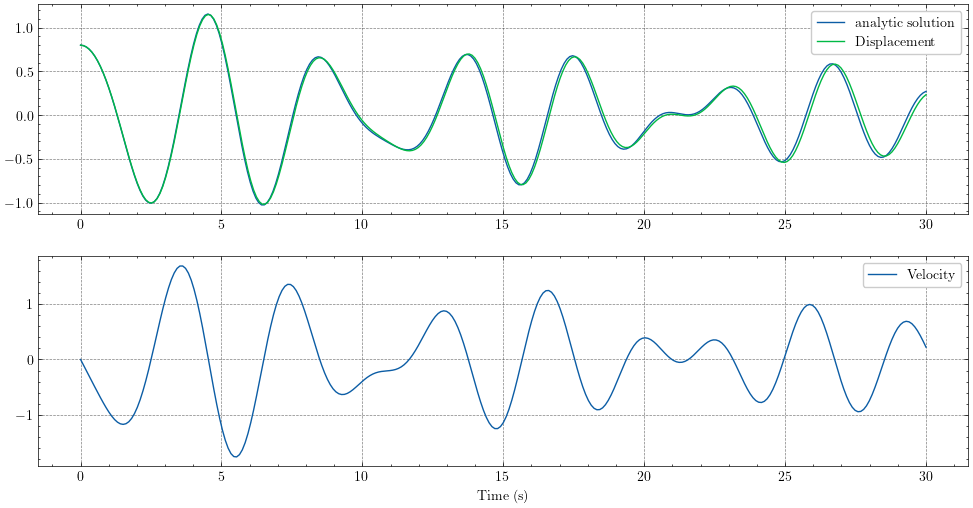

In [24]:
### Newmark Method for structural dynamics

import numpy as np
import matplotlib.pyplot as plt

class NewmarkIntegrator:
    def __init__(self, M, C, K,force , u0, v0, dt, total_time, gamma=1/2, beta=1/4):
        self.M = M  # MassMatrix
        self.C = C  # Damping Matrix
        self.K = K  # Stiffness Matrix
        self.u0 = u0  # Initial displacement
        self.v0 = v0  # Initial velocity
        self.force = force # Function of time
        
        self.dt = dt  # Time step
        self.total_time = total_time  # Total simulation time
        self.gamma = gamma  # Newmark parameter gamma
        self.beta = beta  # Newmark parameter beta
        
        # Initialization
        self.n_steps = int(total_time / dt)
        self.time = np.linspace(0, self.n_steps*self.dt, self.n_steps)
        self.u = np.zeros((len(u0),self.n_steps))
        self.v = np.zeros((len(u0),self.n_steps))
        self.a = np.zeros((len(u0),self.n_steps))

        # Initial conditions
        self.u[:,0] = u0
        self.v[:,0] = v0

    def force(self, t):
        # Define external force as a function of time
        return self.force(t)
    
    
    
    def integrate(self):
        invM = np.linalg.inv(self.M)
        
        a1 = 1.0/(self.beta*self.dt**2)
        a2 = 1.0/(self.beta*self.dt)
        a3 = (1.0-2.0*self.beta)/(self.beta*2.0)
        a4 = self.gamma/(self.beta*self.dt)
        a5 = (1.0-self.gamma/self.beta)
        a6 = (1.0-self.gamma/(2.0*self.beta))*self.dt
        
        # Calculate initial acceleration
        self.a[:,0] = invM @ (self.force(0) - self.C @ self.v0 - self.K @ self.u0)  
        
        # Inverse Effective stiffness
        keff = np.linalg.inv(self.K + a4*self.C + self.M * a1)
        display(keff)
        # Time stepping loop
        for i in range(1, self.n_steps):
            t = i * self.dt

            # b_1
            b_1 = a1*self.u[:,i-1] + a2 * self.v[:,i-1] + a3 * self.a[:,i-1]
            # b_2
            b_2 = a4*self.u[:,i-1] - a5*self.v[:,i-1] - a6*self.a[:,i-1]

            
            self.u[:,i] = keff @ (self.force(t) + self.M @ b_1 + self.C @ b_2)
            self.v[:,i] = a4*(self.u[:,i] - self.u[:,i-1]) + a5*self.v[:,i-1] + a6*self.a[:,i-1]
            self.a[:,i] = a1*(self.u[:,i] - self.u[:,i-1]) - a2*self.v[:,i-1] - a3*self.a[:,i-1]
            

    def plot_results(self):
        fig,ax = plt.subplots(2,1,figsize=(12, 6))
        ax[0].plot(tsa,xa,label="analytic solution")
        ax[0].plot(self.time, self.u[0,:], label='Displacement')
        ax[0].legend()
        
        ax[1].plot(self.time, self.v[0,:], label='Velocity')
        ax[1].legend()
        ax[1].set_xlabel('Time (s)')
        
        return fig,ax


# Usage
M = np.array([[argdict["m"]]])
C = np.array([[argdict["c"]]])
K = np.array([[argdict["k"]]])

u0 = np.array([inidict["x_0"]])
v0 = np.array([inidict["xd_0"]])

dt = tsa[1]-tsa[0]
total_time = tsa[-1]

newmark = NewmarkIntegrator(M, C, K,forceNM, u0, v0, dt, total_time, gamma=0.5, beta=0.25) # Trapezregel
# newmark = NewmarkIntegrator(M, C, K,forceNM, u0, v0, dt, total_time, gamma=1/2, beta=1/6) # Lineares Beschleunigungsverhalten

newmark.integrate()
fig,ax = newmark.plot_results()


In [25]:
fig.savefig("Federschwinger_NM.png",dpi=200)


interactive(children=(FloatSlider(value=0.1, description='Timestep (dt)', layout=Layout(grid_area='widget001')…

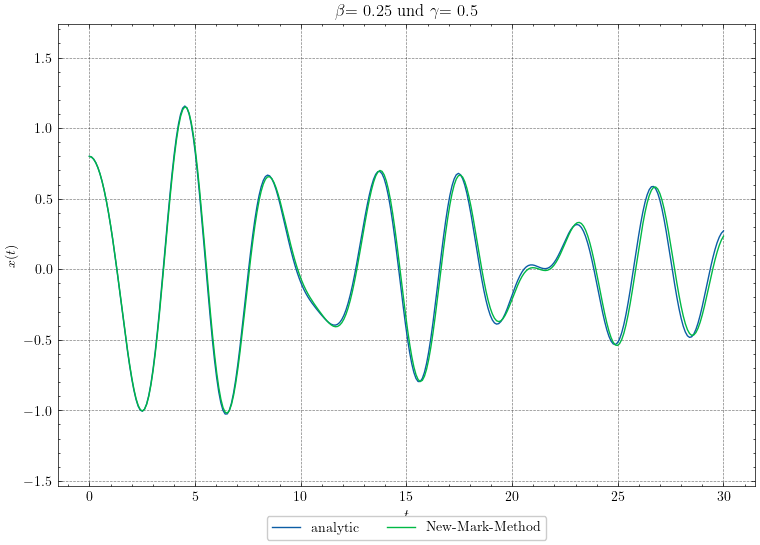

In [ ]:
from ipywidgets import FloatSlider, interact,GridspecLayout


grid_NM = GridspecLayout(4, 2)

# Widget to select dt
grid_NM[0,0] = FloatSlider(value=0.1, min=0.001, max=1.0, step=0.001, description='Timestep (dt)')

grid_NM[2,0] = FloatSlider(value=10, min=0.1, max=100.0, step=0.1, description='Stiffness k')

grid_NM[1,0] = FloatSlider(value=5, min=0.1, max=100.0, step=0.1, description='Mass m')

grid_NM[0,1] = FloatSlider(value=0.5, min=0.0, max=100.0, step=0.1, description='damping c')

grid_NM[1,1] = FloatSlider(value=3, min=0.0, max=100.0, step=0.1, description='Force Amplitude A')

grid_NM[2,1] = FloatSlider(value=2, min=0.0, max=100.0, step=0.1, description='Force frequency $\omega_F$')

grid_NM[3,0] = FloatSlider(value=0.25, min=1e-10, max=0.5, step=0.1, description=r'$\beta$')
grid_NM[3,1] = FloatSlider(value=0.5, min=0.0, max=1.0, step=0.1, description=r'$\gamma$')

def plotSolution_NM(argdict, inidict,beta,gamma, tsa, dt, ax):

# arguments and initial data
    arg = [val for val in argdict.values()]
    y0= np.array([val for val in inidict.values()])
    
    xa,va,x_sol_a,v_sol_a = getAnalyticSolution(argdict,inidict,tsa)
    ax.clear()  # Clear the current axes
    t_end = tsa[-1]
    t_start = tsa[0]
    nsteps = int((t_end-t_start)/dt)
    ts = np.linspace(t_start,t_end,nsteps)

    M = np.array([[argdict["m"]]])
    C = np.array([[argdict["c"]]])
    K = np.array([[argdict["k"]]])
    
    u0 = np.array([inidict["x_0"]])
    v0 = np.array([inidict["xd_0"]])
    
    newmark = NewmarkIntegrator(M, C, K,forceNM, u0, v0, dt, t_end, gamma=gamma, beta=beta) # Lineares Beschleunigungsverhalten

    newmark.integrate()    
    
    ax.plot(tsa,xa,label="analytic")
    ax.plot(ts,newmark.u[0,:],label="New-Mark-Method")
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=2)
    ax.set_title(f'$\\beta$= {beta} und $\\gamma$= {gamma}')
    
    ax.set_xlabel("$t$")
    ax.set_ylabel("$x(t)$")
    
    ax.set_ylim([1.5*np.min(xa),1.5*np.max(xa)])

    
    plt.draw()  # Update the plot   

# Function to update plot with new dt
def update_plot_NM(dt,m,k,c,A,omega_F,beta,gamma):

    argdict = {
    "m":m,
    "k":k,
    "c":c,
    "A" : A,
    "omega_F":omega_F
    }
    
    plotSolution_NM(argdict, inidict,beta,gamma, tsa, dt, ax)


fig, ax = plt.subplots(figsize=(9,6))
# Create interactive plot
interact(update_plot_NM, dt=grid_NM[0,0],m=grid_NM[1,0],k=grid_NM[2,0],c=grid_NM[0,1],A=grid_NM[1,1],omega_F=grid_NM[2,1],beta=grid_NM[3,0],gamma=grid_NM[3,1]); 